# **Data Preprocessing**


## Accessing and Verifying Dataset

 Mounted the Google Drive and ensure that the dataset folder is accessible. The following code mounts the drive, checks if the target folder exists, and lists its contents to confirm that the plant images are available for further processing.

By verifying the folder structure and ensuring the data is accessible, we can proceed with loading and preprocessing the images for model training.


In [1]:
from google.colab import drive
drive.mount('/content/drive')
import os
# MyDrive folder is my home google drive folder
folder_path = '/content/drive/MyDrive/Plants'
# Check if the folder exists
if os.path.exists(folder_path):
  print(f"Folder '{folder_path}' found.")
else:
  print(f"Folder '{folder_path}' not found.")
# List the contents of the folder
for filename in os.listdir(folder_path):
  print(os.path.join(folder_path, filename))

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Folder '/content/drive/MyDrive/Plants' found.
/content/drive/MyDrive/Plants/Monoon longifolium
/content/drive/MyDrive/Plants/Sago plam
/content/drive/MyDrive/Plants/Moses-in-the-cradle
/content/drive/MyDrive/Plants/Bambusa multiplex
/content/drive/MyDrive/Plants/Fern
/content/drive/MyDrive/Plants/Norfolk Island pine
/content/drive/MyDrive/Plants/Blue lily
/content/drive/MyDrive/Plants/Areca palm
/content/drive/MyDrive/Plants/plam lily
/content/drive/MyDrive/Plants/Ceiba


## Import Libraries
Imported key Python libraries for image preprocessing: cv2 for image reading, processing, and saving; numpy for pixel-level operations; random for applying random transformations; matplotlib.pyplot for visualizing images; PIL.Image for additional image handling if needed; and os for managing directories and file paths.

In [2]:
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt
from PIL import Image
import os



## Accessing the Dataset

To begin working with the plant image dataset, we first mounted Google Drive and verified the presence of the dataset folder. The dataset is stored in the `MyDrive/Datasets` directory and contains subfolders for each plant species.

The code below checks if the folder exists and lists its contents to confirm successful access.


In [3]:
def get_file_list(folder_path):
    """
    Gets a list of files from a given folder path.

    Args:
    folder_path: The path to the folder.

    Returns:
    A list of file paths.
    """
    file_list = []
    for filename in os.listdir(folder_path):
        file_path = os.path.join(folder_path, filename)
        if os.path.isfile(file_path):  # Check if it's a file
            file_list.append(file_path)
    return file_list

# Print the first 10 files
if os.path.exists(folder_path):
    files_in_folder = get_file_list(folder_path + '/Sago plam')
    print("List of files:")
    for file in files_in_folder[:10]:
        print(file)
else:
    print(f"Folder '{folder_path}' not found.")

List of files:
/content/drive/MyDrive/Plants/Sago plam/photo_2025-04-29_10-57-00.jpg
/content/drive/MyDrive/Plants/Sago plam/photo_2025-04-29_10-57-00 (2).jpg
/content/drive/MyDrive/Plants/Sago plam/photo_2025-04-29_10-57-01.jpg
/content/drive/MyDrive/Plants/Sago plam/photo_2025-04-29_10-57-03.jpg
/content/drive/MyDrive/Plants/Sago plam/photo_2025-04-29_10-57-04.jpg
/content/drive/MyDrive/Plants/Sago plam/photo_2025-04-29_10-57-05.jpg
/content/drive/MyDrive/Plants/Sago plam/photo_2025-04-29_10-57-07.jpg
/content/drive/MyDrive/Plants/Sago plam/photo_2025-04-29_10-57-08.jpg
/content/drive/MyDrive/Plants/Sago plam/photo_2025-04-29_10-57-09.jpg
/content/drive/MyDrive/Plants/Sago plam/photo_2025-04-29_10-57-09 (2).jpg


## Image Display and Verification

To verify that the image loading is successful, we used OpenCV to load an image of the "Sago Palm" and displayed it using Matplotlib. The image was converted from BGR (default format in OpenCV) to RGB to ensure proper color representation. Below is the visualization of the original image.


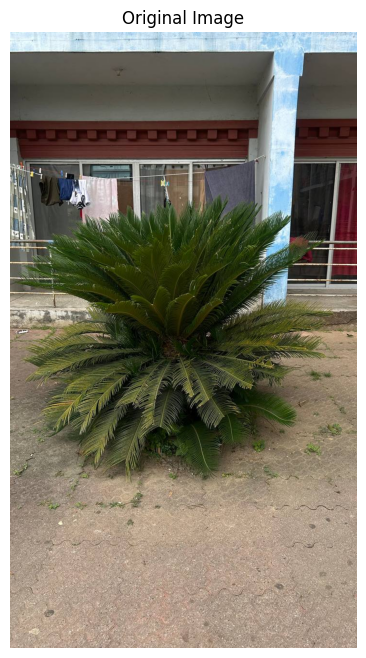

In [4]:

# image path
sago_plam_image_path = '/content/drive/MyDrive/Plants/Sago plam/photo_2025-04-29_10-57-03.jpg'

# Loading image by useing  OpenCV
img = cv2.imread(sago_plam_image_path)

# Checks if the image is loaded correctly
if img is None:
    print("Error: Image not found or failed to load!")
else:
    # Converts the image from BGR to RGB (OpenCV loads images in BGR format by default)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Displays the image using matplotlib
    plt.figure(figsize=(8, 8))  # Adjusts the size of the figure for clarity
    plt.imshow(img_rgb)
    plt.title('Original Image')
    plt.axis('off')  # Removes axis for a clean display
    plt.show()



## Displaying Sample Images with Plant Names

To better understand the structure and content of the dataset, a function was implemented to display sample images from each plant category. This version of the function is enhanced to print and display only the plant name, improving clarity and readability.

Each plant species is stored in its own subfolder under the main dataset directory. The function loops through a predefined list of plant folders and for each:
- Verifies if the folder exists.
- Selects a limited number of images (by default, one image per folder).
- Displays each image using `matplotlib`, with the corresponding **plant name as the title**.

This visual inspection ensures that:
- The images are correctly loaded from each folder.
- The dataset is organized properly.
- The correct labels (plant names) are associated with each image visually.

This is an essential initial step in preprocessing, as it helps confirm that the data is ready for further transformation and model training.


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Folder not found: /content/drive/MyDrive/Plants/Areca plam

Displaying images from plant: Bambusa multiplex


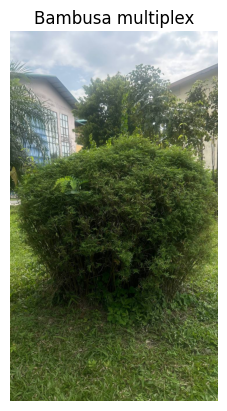


Displaying images from plant: Blue lily


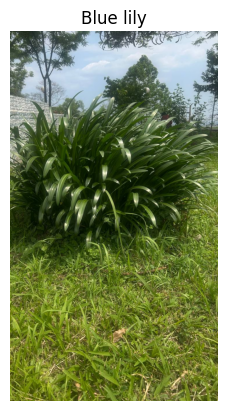


Displaying images from plant: Ceiba


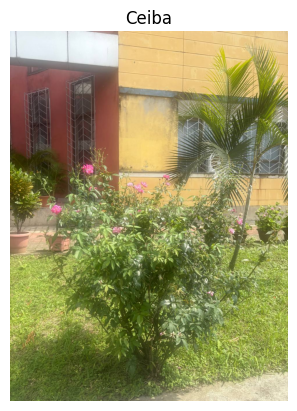


Displaying images from plant: Fern


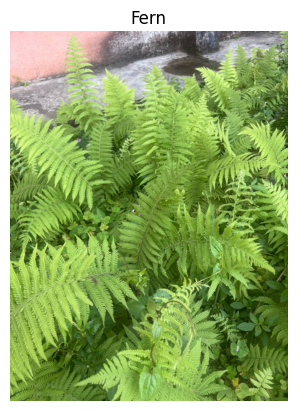


Displaying images from plant: Moses-in-the-cradle


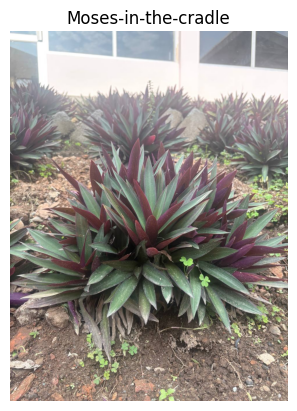


Displaying images from plant: Norfolk Island pine


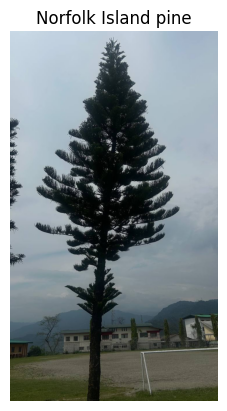


Displaying images from plant: Sago plam


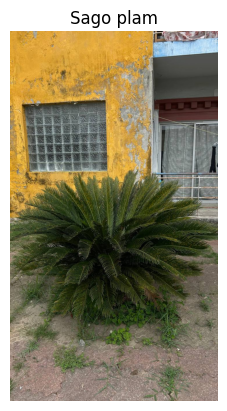


Displaying images from plant: plam lily


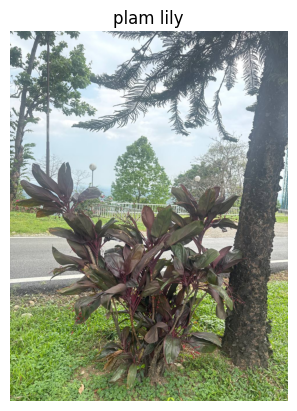

In [5]:

from PIL import Image

def display_images_from_folders(folder_path, num_images=1):
    """
    Displays images from specified folders (cat, dog, rat) within a given path.
    Args:
    folder_path (str): The base path containing the subfolders.
    num_images (int): The maximum number of images to display per folder.
    """
    folders = ['Areca plam', 'Bambusa multiplex', 'Blue lily', 'Ceiba', 'Fern', 'Moses-in-the-cradle', 'Norfolk Island pine', 'Sago plam', 'plam lily']
    for folder in folders:
        image_folder = os.path.join(folder_path, folder)
        if os.path.exists(image_folder):
            print(f"\nDisplaying images from plant: {folder}")
            image_files = [f for f in os.listdir(image_folder) if os.path.isfile(os.path.join(image_folder, f))][:num_images]
            for image_file in image_files:
                image_path = os.path.join(image_folder, image_file)
                try:
                    img = Image.open(image_path)
                    plt.imshow(img)
                    plt.title(f"{folder}")  # Show plant name as title
                    plt.axis('off')
                    plt.show()
                except Exception as e:
                    print(f"Error displaying {image_path}: {e}")
        else:
            print(f"Folder not found: {image_folder}")


from google.colab import drive
drive.mount('/content/drive')
folder_path = '/content/drive/MyDrive/Plants'
display_images_from_folders(folder_path)


##  Grayscale Conversion.

Converted the images to grayscale to simplifies plant images by removing color information, allowing the model to focus on important structural features like shape, edges, and texture. Each image is first resized to a consistent size (224×224) for uniformity, then converted to grayscale using OpenCV, and saved into its respective plant category folder.



Processing: Areca palm
Processed photo_2025-04-29_10-57-11.jpg (1 of 50 images)


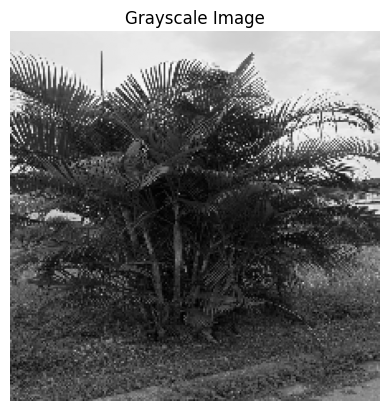

Processed photo_2025-04-29_10-57-11 (2).jpg (2 of 50 images)
Processed photo_2025-04-29_10-57-29.jpg (3 of 50 images)
Processed photo_2025-04-29_10-57-30.jpg (4 of 50 images)
Processed photo_2025-04-29_10-57-31.jpg (5 of 50 images)
Processed photo_2025-04-29_10-57-32.jpg (6 of 50 images)
Processed photo_2025-04-29_10-57-33.jpg (7 of 50 images)
Processed photo_2025-04-29_10-57-33 (2).jpg (8 of 50 images)
Processed photo_2025-04-29_10-57-34.jpg (9 of 50 images)
Processed photo_2025-04-29_10-57-35.jpg (10 of 50 images)
Processed photo_2025-04-29_10-57-36.jpg (11 of 50 images)
Processed photo_2025-04-29_10-57-37.jpg (12 of 50 images)
Processed photo_2025-04-30_18-35-34 (2).jpg (13 of 50 images)
Processed photo_2025-04-30_18-35-37.jpg (14 of 50 images)
Processed photo_2025-04-30_18-35-39.jpg (15 of 50 images)
Processed photo_2025-04-30_18-35-40.jpg (16 of 50 images)
Processed photo_2025-04-30_18-35-41.jpg (17 of 50 images)
Processed photo_2025-04-30_18-35-42.jpg (18 of 50 images)
Processed 

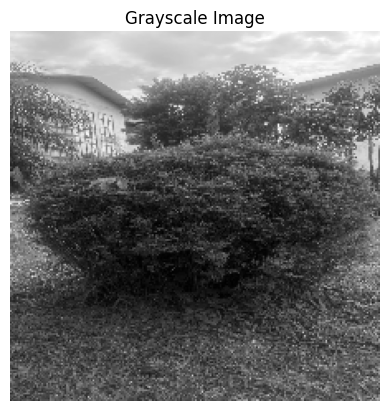

Processed photo_2025-04-30_18-42-06.jpg (2 of 50 images)
Processed photo_2025-04-30_18-42-08.jpg (3 of 50 images)
Processed photo_2025-04-30_18-42-09.jpg (4 of 50 images)
Processed photo_2025-04-30_18-42-10.jpg (5 of 50 images)
Processed photo_2025-04-30_18-42-13.jpg (6 of 50 images)
Processed photo_2025-04-30_16-38-30.jpg (7 of 50 images)
Processed photo_2025-04-30_16-38-32.jpg (8 of 50 images)
Processed photo_2025-04-30_16-38-36.jpg (9 of 50 images)
Processed photo_2025-04-30_16-38-37.jpg (10 of 50 images)
Processed photo_2025-04-30_16-38-39.jpg (11 of 50 images)
Processed photo_2025-04-30_16-38-40.jpg (12 of 50 images)
Processed photo_2025-04-30_16-38-43.jpg (13 of 50 images)
Processed photo_2025-04-30_16-38-45.jpg (14 of 50 images)
Processed photo_2025-04-30_16-38-46.jpg (15 of 50 images)
Processed photo_2025-04-30_16-38-51.jpg (16 of 50 images)
Processed photo_2025-04-30_16-38-53.jpg (17 of 50 images)
Processed photo_2025-04-30_16-38-58.jpg (18 of 50 images)
Processed photo_2025-0

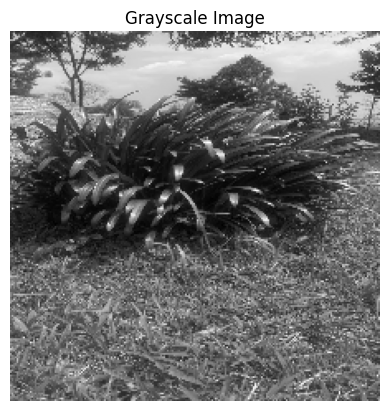

Processed photo_2025-04-30_18-34-29.jpg (2 of 50 images)
Processed photo_2025-04-30_18-34-31.jpg (3 of 50 images)
Processed photo_2025-04-30_18-34-32.jpg (4 of 50 images)
Processed photo_2025-04-30_18-34-34.jpg (5 of 50 images)
Processed photo_2025-04-30_18-34-35.jpg (6 of 50 images)
Processed photo_2025-04-30_18-34-36.jpg (7 of 50 images)
Processed photo_2025-04-30_18-34-37.jpg (8 of 50 images)
Processed photo_2025-04-30_18-34-39.jpg (9 of 50 images)
Processed photo_2025-04-30_18-34-40.jpg (10 of 50 images)
Processed photo_2025-04-30_18-34-40 (2).jpg (11 of 50 images)
Processed photo_2025-04-30_18-34-42.jpg (12 of 50 images)
Processed photo_2025-04-30_18-34-44.jpg (13 of 50 images)
Processed photo_2025-04-30_18-34-45.jpg (14 of 50 images)
Processed photo_2025-04-30_18-34-46.jpg (15 of 50 images)
Processed photo_2025-04-30_18-34-48.jpg (16 of 50 images)
Processed photo_2025-04-30_18-34-49.jpg (17 of 50 images)
Processed photo_2025-04-30_18-34-50.jpg (18 of 50 images)
Processed photo_20

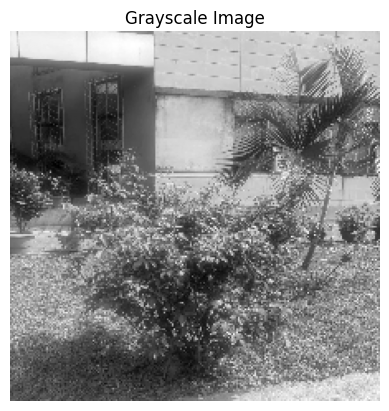

Processed photo_2025-04-30_16-33-38.jpg (2 of 50 images)
Processed photo_2025-04-30_16-33-40.jpg (3 of 50 images)
Processed photo_2025-04-30_16-33-44.jpg (4 of 50 images)
Processed photo_2025-04-30_16-33-45.jpg (5 of 50 images)
Processed photo_2025-04-30_16-33-47.jpg (6 of 50 images)
Processed photo_2025-04-30_16-33-48.jpg (7 of 50 images)
Processed photo_2025-04-30_16-33-50.jpg (8 of 50 images)
Processed photo_2025-04-30_16-33-52.jpg (9 of 50 images)
Processed photo_2025-04-30_16-33-53.jpg (10 of 50 images)
Processed photo_2025-04-30_16-33-56.jpg (11 of 50 images)
Processed photo_2025-04-30_16-33-58.jpg (12 of 50 images)
Processed photo_2025-04-30_16-33-59.jpg (13 of 50 images)
Processed photo_2025-04-30_16-34-01.jpg (14 of 50 images)
Processed photo_2025-04-30_16-34-03.jpg (15 of 50 images)
Processed photo_2025-04-30_16-34-04.jpg (16 of 50 images)
Processed photo_2025-04-30_16-34-06.jpg (17 of 50 images)
Processed photo_2025-04-30_16-34-08.jpg (18 of 50 images)
Processed photo_2025-0

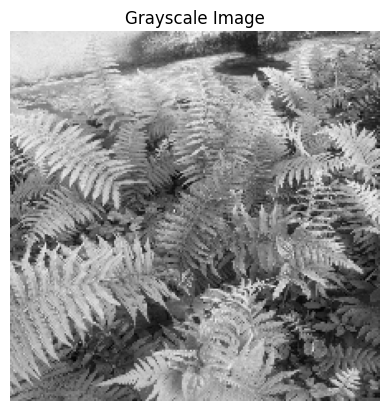

Processed photo_2025-04-30_16-41-09.jpg (2 of 51 images)
Processed photo_2025-04-30_16-41-24.jpg (3 of 51 images)
Processed photo_2025-04-30_16-41-12.jpg (4 of 51 images)
Processed photo_2025-04-30_16-41-40.jpg (5 of 51 images)
Processed photo_2025-04-30_16-41-37.jpg (6 of 51 images)
Processed photo_2025-04-30_16-41-45.jpg (7 of 51 images)
Processed photo_2025-04-30_16-41-52.jpg (8 of 51 images)
Processed photo_2025-04-30_16-41-22.jpg (9 of 51 images)
Processed photo_2025-04-30_16-41-59.jpg (10 of 51 images)
Processed photo_2025-04-30_16-41-26.jpg (11 of 51 images)
Processed photo_2025-04-30_16-41-25.jpg (12 of 51 images)
Processed photo_2025-04-30_16-41-48.jpg (13 of 51 images)
Processed photo_2025-04-30_16-41-43.jpg (14 of 51 images)
Processed photo_2025-04-30_16-41-13.jpg (15 of 51 images)
Processed photo_2025-04-30_16-41-57 (2).jpg (16 of 51 images)
Processed photo_2025-04-30_16-41-35.jpg (17 of 51 images)
Processed photo_2025-04-30_16-41-57.jpg (18 of 51 images)
Processed photo_20

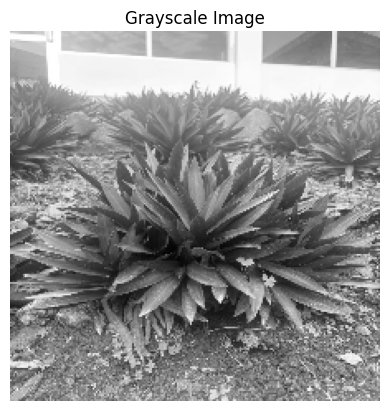

Processed photo_2025-04-30_16-35-13.jpg (2 of 50 images)
Processed photo_2025-04-30_16-35-15.jpg (3 of 50 images)
Processed photo_2025-04-30_16-35-16.jpg (4 of 50 images)
Processed photo_2025-04-30_16-35-27.jpg (5 of 50 images)
Processed photo_2025-04-30_16-35-41.jpg (6 of 50 images)
Processed photo_2025-04-30_16-35-43.jpg (7 of 50 images)
Processed photo_2025-04-30_16-35-54.jpg (8 of 50 images)
Processed photo_2025-04-30_16-36-15.jpg (9 of 50 images)
Processed photo_2025-04-30_16-36-16.jpg (10 of 50 images)
Processed photo_2025-04-30_16-36-43.jpg (11 of 50 images)
Processed photo_2025-04-30_16-36-53.jpg (12 of 50 images)
Processed photo_2025-04-30_16-37-04.jpg (13 of 50 images)
Processed photo_2025-04-30_16-37-12.jpg (14 of 50 images)
Processed photo_2025-04-30_16-37-13.jpg (15 of 50 images)
Processed photo_2025-04-30_16-37-21.jpg (16 of 50 images)
Processed photo_2025-04-30_16-37-32.jpg (17 of 50 images)
Processed photo_2025-04-30_16-37-33.jpg (18 of 50 images)
Processed photo_2025-0

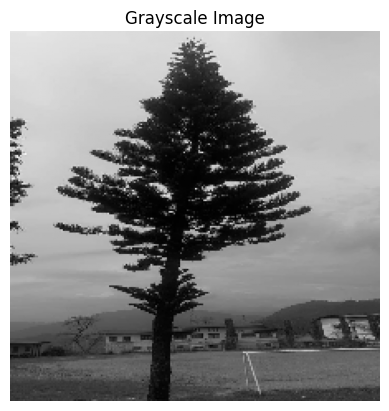

Processed photo_2025-04-30_18-33-50.jpg (2 of 44 images)
Processed photo_2025-04-30_18-33-51.jpg (3 of 44 images)
Processed photo_2025-04-30_18-33-52.jpg (4 of 44 images)
Processed photo_2025-04-30_18-33-53.jpg (5 of 44 images)
Processed photo_2025-04-30_18-33-55.jpg (6 of 44 images)
Processed photo_2025-04-30_18-33-56.jpg (7 of 44 images)
Processed photo_2025-04-30_18-33-57.jpg (8 of 44 images)
Processed photo_2025-04-30_18-33-59.jpg (9 of 44 images)
Processed photo_2025-04-30_18-34-01.jpg (10 of 44 images)
Processed photo_2025-04-30_18-34-03.jpg (11 of 44 images)
Processed photo_2025-04-30_18-34-04.jpg (12 of 44 images)
Processed photo_2025-04-30_18-34-06.jpg (13 of 44 images)
Processed photo_2025-04-30_18-34-08.jpg (14 of 44 images)
Processed photo_2025-04-30_18-34-10.jpg (15 of 44 images)
Processed photo_2025-04-30_18-34-12.jpg (16 of 44 images)
Processed photo_2025-04-30_18-34-13.jpg (17 of 44 images)
Processed photo_2025-04-30_18-34-14.jpg (18 of 44 images)
Processed photo_2025-0

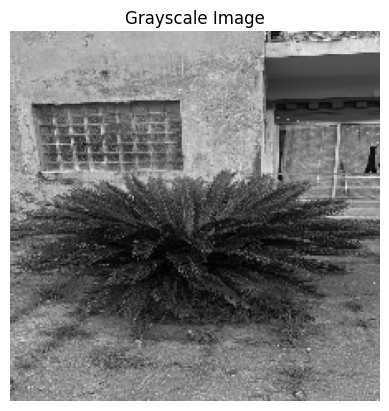

Processed photo_2025-04-29_10-57-00 (2).jpg (2 of 50 images)
Processed photo_2025-04-29_10-57-01.jpg (3 of 50 images)
Processed photo_2025-04-29_10-57-03.jpg (4 of 50 images)
Processed photo_2025-04-29_10-57-04.jpg (5 of 50 images)
Processed photo_2025-04-29_10-57-05.jpg (6 of 50 images)
Processed photo_2025-04-29_10-57-07.jpg (7 of 50 images)
Processed photo_2025-04-29_10-57-08.jpg (8 of 50 images)
Processed photo_2025-04-29_10-57-09.jpg (9 of 50 images)
Processed photo_2025-04-29_10-57-09 (2).jpg (10 of 50 images)
Processed photo_2025-04-29_10-57-12.jpg (11 of 50 images)
Processed photo_2025-04-29_10-57-13.jpg (12 of 50 images)
Processed photo_2025-04-29_10-57-14.jpg (13 of 50 images)
Processed photo_2025-04-29_10-57-15.jpg (14 of 50 images)
Processed photo_2025-04-29_10-57-16.jpg (15 of 50 images)
Processed photo_2025-04-29_10-57-17.jpg (16 of 50 images)
Processed photo_2025-04-29_10-57-18.jpg (17 of 50 images)
Processed photo_2025-04-29_10-57-18 (2).jpg (18 of 50 images)
Processed 

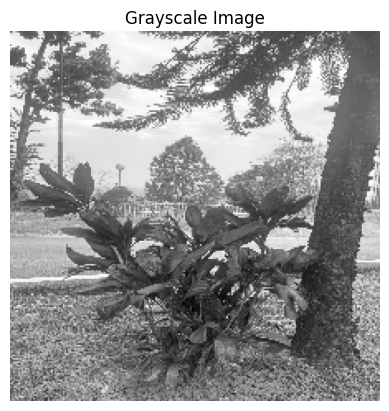

Processed photo_2025-04-30_16-31-55.jpg (2 of 50 images)
Processed photo_2025-04-30_16-33-04.jpg (3 of 50 images)
Processed photo_2025-04-30_16-31-51.jpg (4 of 50 images)
Processed photo_2025-04-30_16-32-49.jpg (5 of 50 images)
Processed photo_2025-04-30_16-32-54.jpg (6 of 50 images)
Processed photo_2025-04-30_16-32-32.jpg (7 of 50 images)
Processed photo_2025-04-30_16-32-22.jpg (8 of 50 images)
Processed photo_2025-04-30_16-32-38.jpg (9 of 50 images)
Processed photo_2025-04-30_16-33-01.jpg (10 of 50 images)
Processed photo_2025-04-30_16-32-39.jpg (11 of 50 images)
Processed photo_2025-04-30_16-32-53.jpg (12 of 50 images)
Processed photo_2025-04-30_16-32-41.jpg (13 of 50 images)
Processed photo_2025-04-29_10-57-06 (2).jpg (14 of 50 images)
Processed photo_2025-04-30_16-31-45.jpg (15 of 50 images)
Processed photo_2025-04-30_16-32-18.jpg (16 of 50 images)
Processed photo_2025-04-30_16-32-11.jpg (17 of 50 images)
Processed photo_2025-04-30_16-32-01.jpg (18 of 50 images)
Processed photo_20

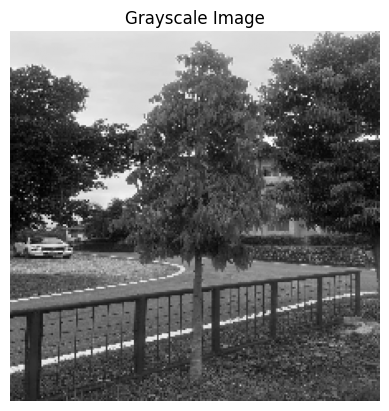

Processed photo_2025-04-30_18-33-38.jpg (2 of 52 images)
Processed photo_2025-04-30_16-31-15.jpg (3 of 52 images)
Processed photo_2025-04-30_16-31-16.jpg (4 of 52 images)
Processed photo_2025-04-30_18-35-49.jpg (5 of 52 images)
Processed photo_2025-04-30_18-33-46 (2).jpg (6 of 52 images)
Processed photo_2025-04-30_18-33-10.jpg (7 of 52 images)
Processed photo_2025-04-30_18-33-30.jpg (8 of 52 images)
Processed photo_2025-04-30_18-33-27.jpg (9 of 52 images)
Processed photo_2025-04-30_18-33-33.jpg (10 of 52 images)
Processed photo_2025-04-30_18-33-46.jpg (11 of 52 images)
Processed photo_2025-04-30_18-33-42.jpg (12 of 52 images)
Processed photo_2025-04-30_18-33-29.jpg (13 of 52 images)
Processed photo_2025-04-30_18-33-40.jpg (14 of 52 images)
Processed photo_2025-04-30_18-33-34.jpg (15 of 52 images)
Processed photo_2025-04-30_18-33-26.jpg (16 of 52 images)
Processed photo_2025-04-30_16-31-11.jpg (17 of 52 images)
Processed photo_2025-04-30_18-33-32.jpg (18 of 52 images)
Processed photo_20

In [6]:
# Function to convert images to grayscale and save them
def convert_to_grayscale(input_folder, output_folder, resize=True, max_size=(224, 224)):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    image_count = 0
    for image_name in os.listdir(input_folder):
        image_path = os.path.join(input_folder, image_name)

        if image_name.endswith(('.png', '.jpg', '.jpeg')):
            image_count += 1

            # Loads and resizes the image
            image = cv2.imread(image_path)
            if resize:
                image = cv2.resize(image, max_size)

            # Convert to grayscale
            gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

            # Save the grayscale image
            output_path = os.path.join(output_folder, image_name)
            cv2.imwrite(output_path, gray_image)

            print(f"Processed {image_name} ({image_count} of {len(os.listdir(input_folder))} images)")

            # Visualize the first one
            if image_count == 1:
                plt.imshow(gray_image, cmap='gray')
                plt.title("Grayscale Image")
                plt.axis('off')
                plt.show()

# List of  10 plant folder names
plant_folders = [
    'Areca palm',
    'Bambusa multiplex',
    'Blue lily',
    'Ceiba',
    'Fern',
    'Moses-in-the-cradle',
    'Norfolk Island pine',
    'Sago plam',
    'plam lily',
    'Monoon longifolium'
]

# Base paths
base_input_path = '/content/drive/MyDrive/Plants'
base_output_path = '/content/drive/MyDrive/Processed_plants'

# Apply the function to all plants
for plant in plant_folders:
    input_path = os.path.join(base_input_path, plant)
    output_path = os.path.join(base_output_path, plant)
    print(f"\nProcessing: {plant}")
    convert_to_grayscale(input_path, output_path)


## Random Rotation

This code enhances grayscale plant images by introducing random rotations to simulate natural variations in how plants might be photographed. For each plant category, it randomly selects up to 20 images, calculates a random angle between -30 and +30 degrees, and rotates each image around its center using OpenCV’s transformation matrix. The rotated images are saved with a _rotated suffix in the same folder. This process is done to increase dataset diversity and improve the robustness of the machine learning model by making it more invariant to orientation changes.

[Areca palm] Found 50 images.
[Areca palm] Rotated and saved: photo_2025-05-07_11-38-39_rotated.jpg (1/20)


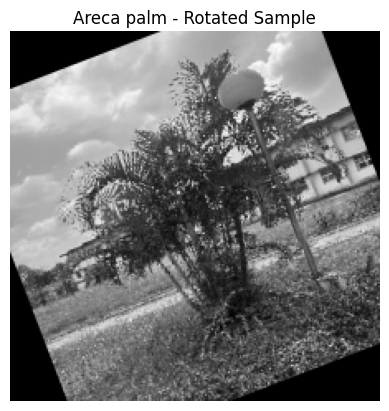

[Areca palm] Rotated and saved: photo_2025-04-29_10-57-32_rotated.jpg (2/20)
[Areca palm] Rotated and saved: photo_2025-04-30_18-35-43_rotated.jpg (3/20)
[Areca palm] Rotated and saved: photo_2025-05-07_11-38-53_rotated.jpg (4/20)
[Areca palm] Rotated and saved: photo_2025-05-07_11-38-28_rotated.jpg (5/20)
[Areca palm] Rotated and saved: photo_2025-04-30_18-35-40_rotated.jpg (6/20)
[Areca palm] Rotated and saved: photo_2025-04-29_10-57-11 (2)_rotated.jpg (7/20)
[Areca palm] Rotated and saved: photo_2025-05-07_11-38-16_rotated.jpg (8/20)
[Areca palm] Rotated and saved: photo_2025-04-30_18-35-39_rotated.jpg (9/20)
[Areca palm] Rotated and saved: photo_2025-04-29_10-57-37_rotated.jpg (10/20)
[Areca palm] Rotated and saved: photo_2025-05-07_11-38-32_rotated.jpg (11/20)
[Areca palm] Rotated and saved: photo_2025-05-07_11-38-24_rotated.jpg (12/20)
[Areca palm] Rotated and saved: photo_2025-05-07_11-39-12_rotated.jpg (13/20)
[Areca palm] Rotated and saved: photo_2025-05-07_11-38-50_rotated.jp

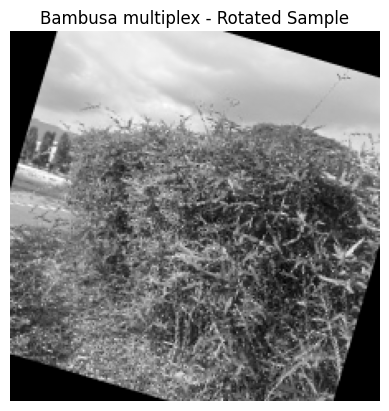

[Bambusa multiplex] Rotated and saved: photo_2025-04-30_16-39-02_rotated.jpg (2/20)
[Bambusa multiplex] Rotated and saved: photo_2025-04-30_16-40-40_rotated.jpg (3/20)
[Bambusa multiplex] Rotated and saved: photo_2025-04-30_16-39-33_rotated.jpg (4/20)
[Bambusa multiplex] Rotated and saved: photo_2025-04-30_16-40-19_rotated.jpg (5/20)
[Bambusa multiplex] Rotated and saved: photo_2025-04-30_16-40-32_rotated.jpg (6/20)
[Bambusa multiplex] Rotated and saved: photo_2025-04-30_16-41-07_rotated.jpg (7/20)
[Bambusa multiplex] Rotated and saved: photo_2025-04-30_16-40-06_rotated.jpg (8/20)
[Bambusa multiplex] Rotated and saved: photo_2025-04-30_16-38-51_rotated.jpg (9/20)
[Bambusa multiplex] Rotated and saved: photo_2025-04-30_16-40-53_rotated.jpg (10/20)
[Bambusa multiplex] Rotated and saved: photo_2025-04-30_16-40-14_rotated.jpg (11/20)
[Bambusa multiplex] Rotated and saved: photo_2025-04-30_16-39-11_rotated.jpg (12/20)
[Bambusa multiplex] Rotated and saved: photo_2025-04-30_16-38-53_rotated.

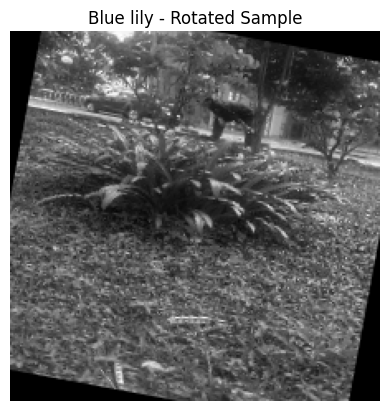

[Blue lily] Rotated and saved: photo_2025-04-30_18-34-32_rotated.jpg (2/20)
[Blue lily] Rotated and saved: photo_2025-04-30_18-35-22 (2)_rotated.jpg (3/20)
[Blue lily] Rotated and saved: photo_2025-04-30_18-35-20_rotated.jpg (4/20)
[Blue lily] Rotated and saved: photo_2025-04-30_18-35-14_rotated.jpg (5/20)
[Blue lily] Rotated and saved: photo_2025-04-30_18-34-59_rotated.jpg (6/20)
[Blue lily] Rotated and saved: photo_2025-04-30_18-34-31_rotated.jpg (7/20)
[Blue lily] Rotated and saved: photo_2025-04-30_18-34-36_rotated.jpg (8/20)
[Blue lily] Rotated and saved: photo_2025-04-30_18-35-04_rotated.jpg (9/20)
[Blue lily] Rotated and saved: photo_2025-04-30_18-35-10_rotated.jpg (10/20)
[Blue lily] Rotated and saved: photo_2025-04-30_18-34-40 (2)_rotated.jpg (11/20)
[Blue lily] Rotated and saved: photo_2025-04-30_16-33-11_rotated.jpg (12/20)
[Blue lily] Rotated and saved: photo_2025-04-30_18-34-35_rotated.jpg (13/20)
[Blue lily] Rotated and saved: photo_2025-04-30_18-34-52_rotated.jpg (14/20)

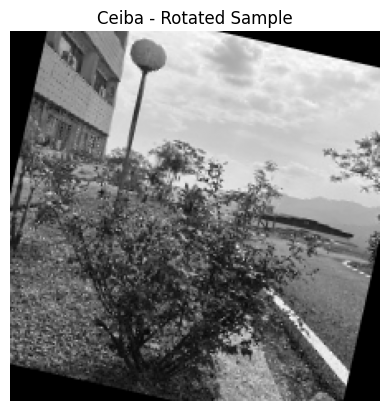

[Ceiba] Rotated and saved: photo_2025-04-30_16-33-25_rotated.jpg (2/20)
[Ceiba] Rotated and saved: photo_2025-04-30_16-34-29_rotated.jpg (3/20)
[Ceiba] Rotated and saved: photo_2025-04-30_18-42-26_rotated.jpg (4/20)
[Ceiba] Rotated and saved: photo_2025-04-30_16-33-40_rotated.jpg (5/20)
[Ceiba] Rotated and saved: photo_2025-04-30_16-33-48_rotated.jpg (6/20)
[Ceiba] Rotated and saved: photo_2025-04-30_16-33-52_rotated.jpg (7/20)
[Ceiba] Rotated and saved: photo_2025-04-30_18-42-11_rotated.jpg (8/20)
[Ceiba] Rotated and saved: photo_2025-04-30_18-42-16_rotated.jpg (9/20)
[Ceiba] Rotated and saved: photo_2025-04-30_16-34-26_rotated.jpg (10/20)
[Ceiba] Rotated and saved: photo_2025-04-30_16-34-41_rotated.jpg (11/20)
[Ceiba] Rotated and saved: photo_2025-04-30_18-42-23_rotated.jpg (12/20)
[Ceiba] Rotated and saved: photo_2025-04-30_16-34-40_rotated.jpg (13/20)
[Ceiba] Rotated and saved: photo_2025-04-30_16-34-15_rotated.jpg (14/20)
[Ceiba] Rotated and saved: photo_2025-04-30_18-35-50_rotate

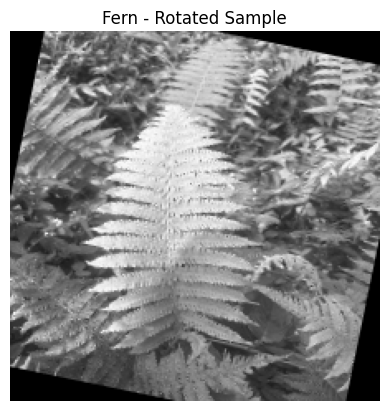

[Fern] Rotated and saved: photo_2025-04-30_16-41-54_rotated.jpg (2/20)
[Fern] Rotated and saved: photo_2025-04-30_16-41-25_rotated.jpg (3/20)
[Fern] Rotated and saved: photo_2025-04-30_16-41-46_rotated.jpg (4/20)
[Fern] Rotated and saved: photo_2025-04-30_16-41-16_rotated.jpg (5/20)
[Fern] Rotated and saved: photo_2025-04-30_16-41-57_rotated.jpg (6/20)
[Fern] Rotated and saved: photo_2025-04-30_16-41-45_rotated.jpg (7/20)
[Fern] Rotated and saved: photo_2025-04-30_16-41-20_rotated.jpg (8/20)
[Fern] Rotated and saved: photo_2025-04-30_16-41-23_rotated.jpg (9/20)
[Fern] Rotated and saved: photo_2025-04-30_16-42-00_rotated.jpg (10/20)
[Fern] Rotated and saved: photo_2025-04-30_16-41-49 (2)_rotated.jpg (11/20)
[Fern] Rotated and saved: photo_2025-04-30_16-41-38_rotated.jpg (12/20)
[Fern] Rotated and saved: photo_2025-04-30_16-42-06_rotated.jpg (13/20)
[Fern] Rotated and saved: photo_2025-04-30_16-41-24_rotated.jpg (14/20)
[Fern] Rotated and saved: photo_2025-04-30_16-41-32_rotated.jpg (15/

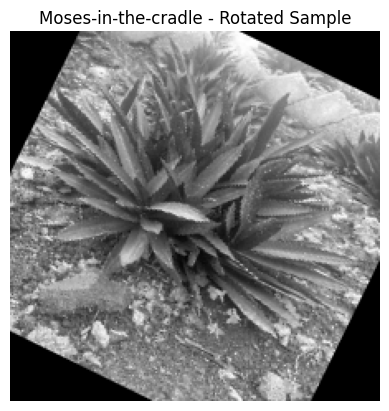

[Moses-in-the-cradle] Rotated and saved: photo_2025-04-30_16-38-15_rotated.jpg (2/20)
[Moses-in-the-cradle] Rotated and saved: photo_2025-04-30_16-35-41_rotated.jpg (3/20)
[Moses-in-the-cradle] Rotated and saved: photo_2025-04-30_16-38-11_rotated.jpg (4/20)
[Moses-in-the-cradle] Rotated and saved: photo_2025-04-30_16-37-47_rotated.jpg (5/20)
[Moses-in-the-cradle] Rotated and saved: photo_2025-04-30_16-37-42_rotated.jpg (6/20)
[Moses-in-the-cradle] Rotated and saved: photo_2025-04-30_16-37-52_rotated.jpg (7/20)
[Moses-in-the-cradle] Rotated and saved: photo_2025-04-30_16-35-27_rotated.jpg (8/20)
[Moses-in-the-cradle] Rotated and saved: photo_2025-04-30_16-37-34_rotated.jpg (9/20)
[Moses-in-the-cradle] Rotated and saved: photo_2025-04-30_16-35-15_rotated.jpg (10/20)
[Moses-in-the-cradle] Rotated and saved: photo_2025-04-30_16-35-54_rotated.jpg (11/20)
[Moses-in-the-cradle] Rotated and saved: photo_2025-04-30_16-37-41_rotated.jpg (12/20)
[Moses-in-the-cradle] Rotated and saved: photo_2025

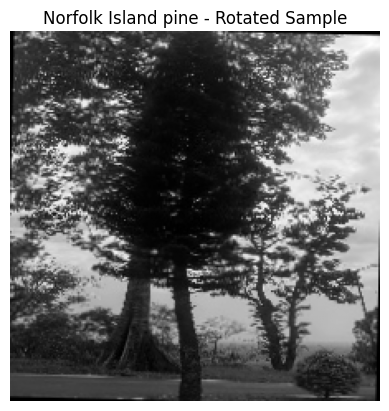

[Norfolk Island pine] Rotated and saved: photo_2025-04-30_16-31-44_rotated.jpg (2/20)
[Norfolk Island pine] Rotated and saved: photo_2025-04-30_18-33-57_rotated.jpg (3/20)
[Norfolk Island pine] Rotated and saved: photo_2025-04-30_16-31-25_rotated.jpg (4/20)
[Norfolk Island pine] Rotated and saved: photo_2025-04-30_18-34-17_rotated.jpg (5/20)
[Norfolk Island pine] Rotated and saved: photo_2025-04-30_18-34-03_rotated.jpg (6/20)
[Norfolk Island pine] Rotated and saved: photo_2025-04-30_18-34-04_rotated.jpg (7/20)
[Norfolk Island pine] Rotated and saved: photo_2025-04-30_18-34-18_rotated.jpg (8/20)
[Norfolk Island pine] Rotated and saved: photo_2025-04-30_16-31-24_rotated.jpg (9/20)
[Norfolk Island pine] Rotated and saved: photo_2025-04-30_18-33-49_rotated.jpg (10/20)
[Norfolk Island pine] Rotated and saved: photo_2025-04-30_18-34-16_rotated.jpg (11/20)
[Norfolk Island pine] Rotated and saved: photo_2025-04-30_18-33-56_rotated.jpg (12/20)
[Norfolk Island pine] Rotated and saved: photo_2025

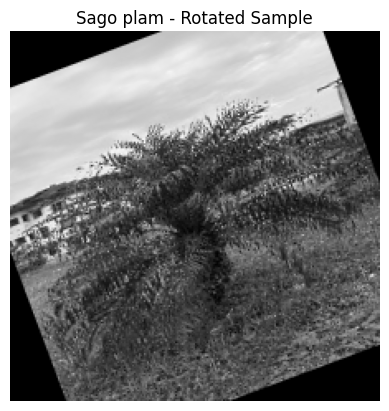

[Sago plam] Rotated and saved: photo_2025-04-29_10-57-15_rotated.jpg (2/20)
[Sago plam] Rotated and saved: photo_2025-04-29_10-57-09 (2)_rotated.jpg (3/20)
[Sago plam] Rotated and saved: photo_2025-04-29_10-57-27_rotated.jpg (4/20)
[Sago plam] Rotated and saved: photo_2025-04-29_10-57-28_rotated.jpg (5/20)
[Sago plam] Rotated and saved: photo_2025-05-07_11-40-12_rotated.jpg (6/20)
[Sago plam] Rotated and saved: photo_2025-05-07_11-42-14_rotated.jpg (7/20)
[Sago plam] Rotated and saved: photo_2025-05-07_11-42-12_rotated.jpg (8/20)
[Sago plam] Rotated and saved: photo_2025-04-30_18-35-47_rotated.jpg (9/20)
[Sago plam] Rotated and saved: photo_2025-05-07_11-40-14_rotated.jpg (10/20)
[Sago plam] Rotated and saved: photo_2025-04-29_10-57-17_rotated.jpg (11/20)
[Sago plam] Rotated and saved: photo_2025-04-30_18-35-46_rotated.jpg (12/20)
[Sago plam] Rotated and saved: photo_2025-04-29_10-57-05_rotated.jpg (13/20)
[Sago plam] Rotated and saved: photo_2025-04-29_10-57-08_rotated.jpg (14/20)
[Sa

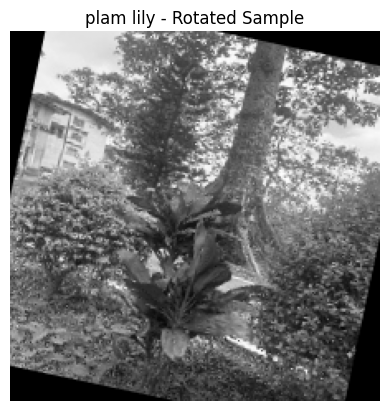

[plam lily] Rotated and saved: photo_2025-04-30_16-31-51_rotated.jpg (2/20)
[plam lily] Rotated and saved: photo_2025-04-29_10-57-06 (2)_rotated.jpg (3/20)
[plam lily] Rotated and saved: photo_2025-04-30_16-32-48_rotated.jpg (4/20)
[plam lily] Rotated and saved: photo_2025-04-30_16-32-07_rotated.jpg (5/20)
[plam lily] Rotated and saved: photo_2025-04-30_16-32-11_rotated.jpg (6/20)
[plam lily] Rotated and saved: photo_2025-04-30_16-32-25_rotated.jpg (7/20)
[plam lily] Rotated and saved: photo_2025-04-30_16-31-48_rotated.jpg (8/20)
[plam lily] Rotated and saved: photo_2025-04-30_16-32-39_rotated.jpg (9/20)
[plam lily] Rotated and saved: photo_2025-04-30_16-32-03_rotated.jpg (10/20)
[plam lily] Rotated and saved: photo_2025-04-30_16-32-26_rotated.jpg (11/20)
[plam lily] Rotated and saved: photo_2025-04-30_16-32-53_rotated.jpg (12/20)
[plam lily] Rotated and saved: photo_2025-04-30_16-32-42_rotated.jpg (13/20)
[plam lily] Rotated and saved: photo_2025-04-30_16-32-49_rotated.jpg (14/20)
[pl

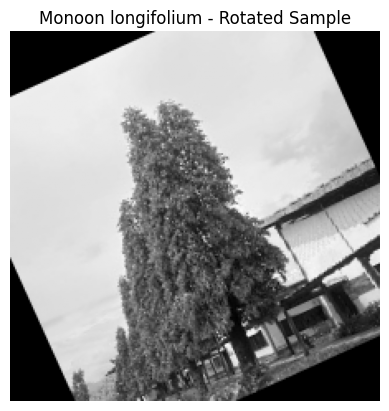

[Monoon longifolium] Rotated and saved: photo_2025-04-30_18-32-57_rotated.jpg (2/20)
[Monoon longifolium] Rotated and saved: photo_2025-04-30_18-33-47_rotated.jpg (3/20)
[Monoon longifolium] Rotated and saved: photo_2025-04-30_18-33-34_rotated.jpg (4/20)
[Monoon longifolium] Rotated and saved: photo_2025-04-30_18-33-07_rotated.jpg (5/20)
[Monoon longifolium] Rotated and saved: photo_2025-04-30_18-33-04_rotated.jpg (6/20)
[Monoon longifolium] Rotated and saved: photo_2025-04-30_18-35-48_rotated.jpg (7/20)
[Monoon longifolium] Rotated and saved: photo_2025-04-30_18-32-58_rotated.jpg (8/20)
[Monoon longifolium] Rotated and saved: photo_2025-04-30_16-31-07_rotated.jpg (9/20)
[Monoon longifolium] Rotated and saved: photo_2025-04-30_18-33-10_rotated.jpg (10/20)
[Monoon longifolium] Rotated and saved: photo_2025-04-30_18-33-17 (2)_rotated.jpg (11/20)
[Monoon longifolium] Rotated and saved: photo_2025-04-30_18-33-42_rotated.jpg (12/20)
[Monoon longifolium] Rotated and saved: photo_2025-04-30_1

In [7]:
# Function to randomly rotate around 20 grayscale images per plant category
def random_rotate_from_grayscale(input_root, max_rotate_per_plant=20, angle_range=(-30, 30)):
    """
    Randomly selects ~20 grayscale images per plant folder, applies rotation,
    and saves them in the same folder with new names.
    """
    plant_categories = os.listdir(input_root)

    for plant_name in plant_categories:
        input_folder = os.path.join(input_root, plant_name)

        if not os.path.isdir(input_folder):
            continue  # Skip non-folder entries

        # Collect all valid grayscale images in the folder
        valid_images = [f for f in os.listdir(input_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]
        print(f"[{plant_name}] Found {len(valid_images)} images.")

        # Randomly chooses up to 20 images
        selected_images = random.sample(valid_images, min(max_rotate_per_plant, len(valid_images)))

        for idx, image_name in enumerate(selected_images):
            image_path = os.path.join(input_folder, image_name)

            # Read the grayscale image
            gray_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

            # Randomly choose an angle within range
            angle = random.uniform(angle_range[0], angle_range[1])

            # Get image center
            center = (gray_image.shape[1] // 2, gray_image.shape[0] // 2)

            # Create rotation matrix and rotate
            rot_matrix = cv2.getRotationMatrix2D(center, angle, scale=1.0)
            rotated_image = cv2.warpAffine(gray_image, rot_matrix, (gray_image.shape[1], gray_image.shape[0]))

            # Generate a new filename with "_rotated"
            base, ext = os.path.splitext(image_name)
            new_name = f"{base}_rotated{ext}"
            output_path = os.path.join(input_folder, new_name)

            # Save the rotated image
            cv2.imwrite(output_path, rotated_image)

            print(f"[{plant_name}] Rotated and saved: {new_name} ({idx+1}/{len(selected_images)})")

            # Show the first rotated image for this plant
            if idx == 0:
                plt.imshow(rotated_image, cmap='gray')
                plt.title(f"{plant_name} - Rotated Sample")
                plt.axis('off')
                plt.show()

# Input: already-grayscale folders
input_root = '/content/drive/MyDrive/Processed_plants'

# function to apply random rotation to 20 images per plant
random_rotate_from_grayscale(input_root)


## Random Vertical Flipping

This code randomly flips 20 original grayscale images (excluding already rotated or flipped images) for each plant category. It flips each image vertically and saves the flipped image in the same folder with a "_flipped" added to the filename. The first flipped image is shown as a preview. This helps the model learn to recognize plants from different angles.

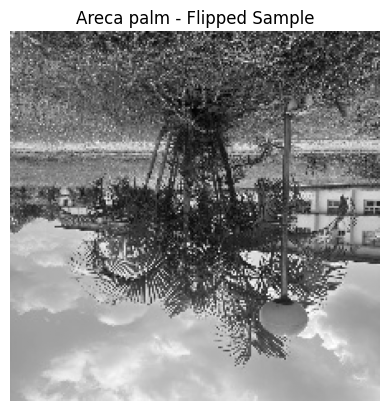

[Areca palm] Flipped and saved 20 images.


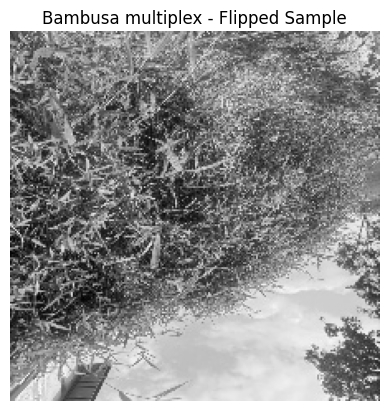

[Bambusa multiplex] Flipped and saved 20 images.


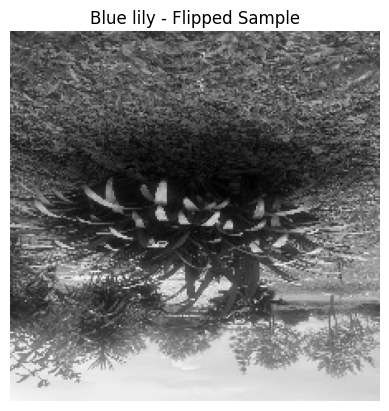

[Blue lily] Flipped and saved 20 images.


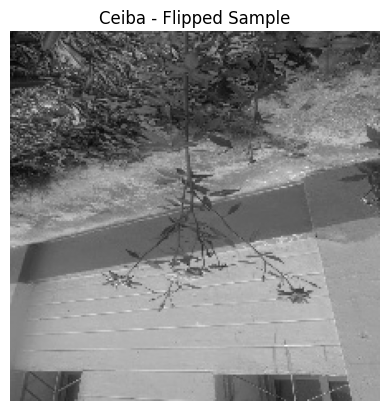

[Ceiba] Flipped and saved 20 images.


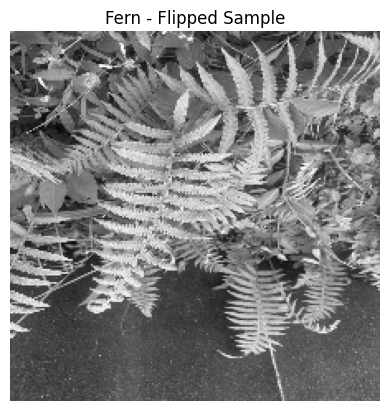

[Fern] Flipped and saved 20 images.


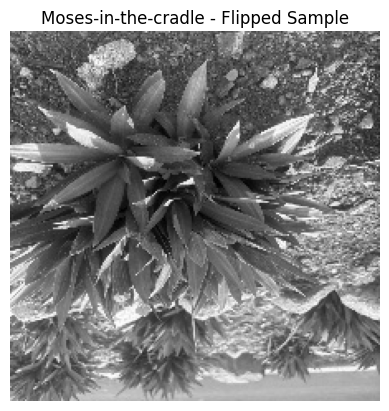

[Moses-in-the-cradle] Flipped and saved 20 images.


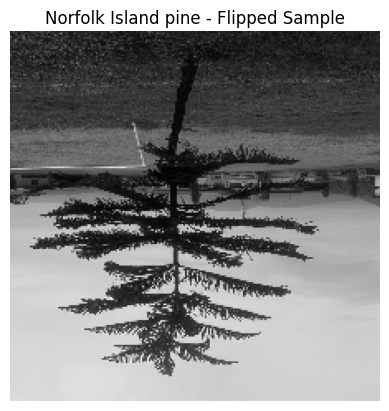

[Norfolk Island pine] Flipped and saved 20 images.


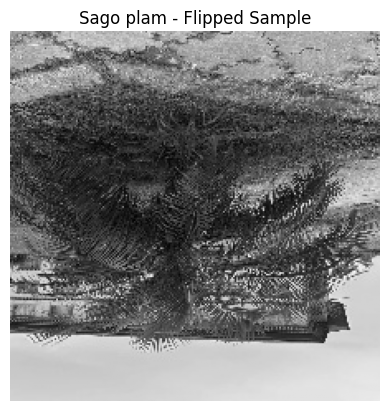

[Sago plam] Flipped and saved 20 images.


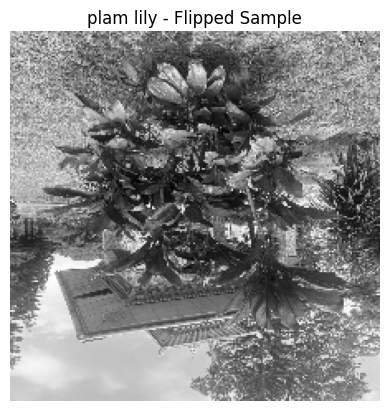

[plam lily] Flipped and saved 20 images.


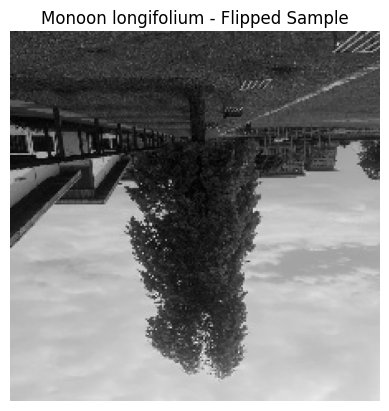

[Monoon longifolium] Flipped and saved 20 images.


In [8]:
# Flip grayscale images (skip rotated and flipped ones)
def random_flip_20_grayscale_images(input_root, output_root, num_flips=20):
    """
    Randomly flips 20 original grayscale images (not rotated or flipped) per plant
    and saves them in the same plant folder with '_flipped' in the filename.

    """
    plant_folders = os.listdir(input_root)

    for plant_name in plant_folders:
        input_folder = os.path.join(input_root, plant_name)
        output_folder = os.path.join(output_root, plant_name)

        if not os.path.exists(output_folder):
            os.makedirs(output_folder)

        # Filter to only  grayscale images (exclude rotated)
        valid_images = [
            f for f in os.listdir(input_folder)
            if f.endswith(('.jpg', '.jpeg', '.png')) and
            '_rotated' not in f and '_flipped' not in f
        ]

        # Randomly select up to 20 grayscale images
        selected_images = random.sample(valid_images, min(num_flips, len(valid_images)))
        flip_count = 0

        for image_name in selected_images:
            image_path = os.path.join(input_folder, image_name)
            image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

            # Flip vertically
            flipped_image = cv2.flip(image, 0)  # 0 = vertical flip

            # Create a new filename to avoid overwriting
            flipped_name = os.path.splitext(image_name)[0] + "_flipped" + os.path.splitext(image_name)[1]
            output_path = os.path.join(output_folder, flipped_name)
            cv2.imwrite(output_path, flipped_image)

            flip_count += 1

            # Show preview of the first flipped image
            if flip_count == 1:
                plt.imshow(flipped_image, cmap='gray')
                plt.title(f"{plant_name} - Flipped Sample")
                plt.axis('off')
                plt.show()

        print(f"[{plant_name}] Flipped and saved {flip_count} images.")

# Set your paths
input_root = '/content/drive/MyDrive/Processed_plants'
output_root = input_root  # Save back into the same folder

# Executes the process
random_flip_20_grayscale_images(input_root, output_root)


## CLAHE (Contrast Limited Adaptive Histogram Equalization)
This code  randomly selected grayscale images from each plant category. It processes up to 20 original grayscale images per plant folder, excluding any that have been previously rotated, flipped. The CLAHE technique improves the contrast of the images, making details in darker or lighter regions more distinguishable. The enhanced images are saved with the suffix '_clahe'. This preprocessing step helps improve feature visibility, which can aid in better plant classification based on shape and other subtle features. The first enhanced image from each plant category is displayed as a preview.

[Areca palm] Applying CLAHE to 20 images.


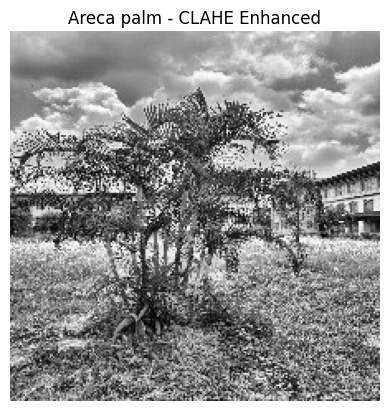

[Bambusa multiplex] Applying CLAHE to 20 images.


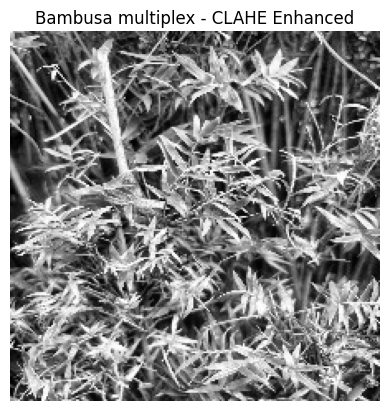

[Blue lily] Applying CLAHE to 20 images.


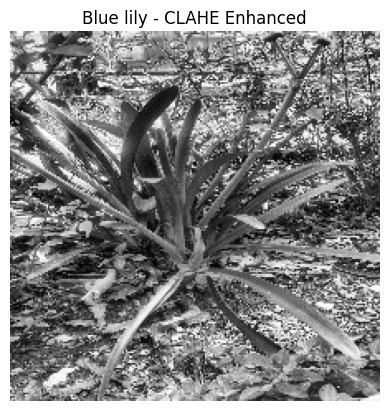

[Ceiba] Applying CLAHE to 20 images.


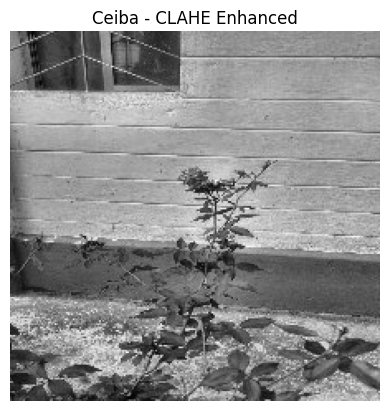

[Fern] Applying CLAHE to 20 images.


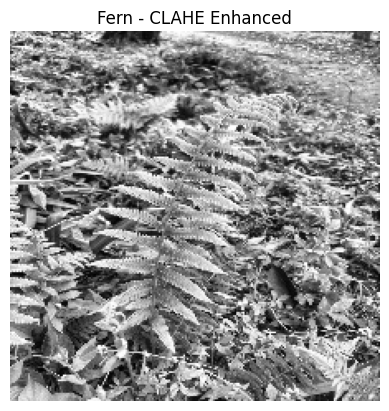

[Moses-in-the-cradle] Applying CLAHE to 20 images.


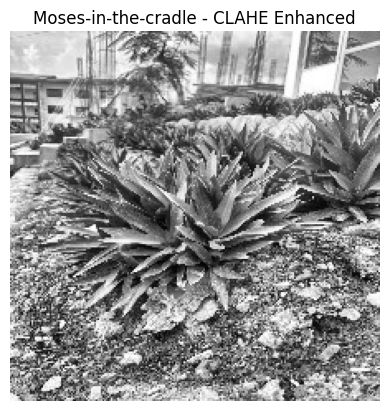

[Norfolk Island pine] Applying CLAHE to 20 images.


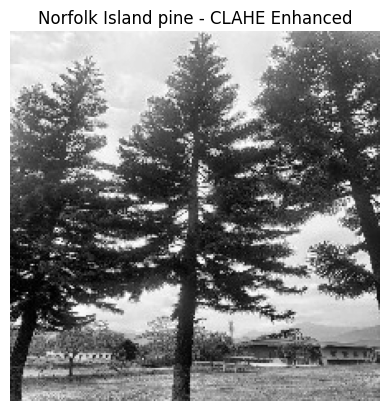

[Sago plam] Applying CLAHE to 20 images.


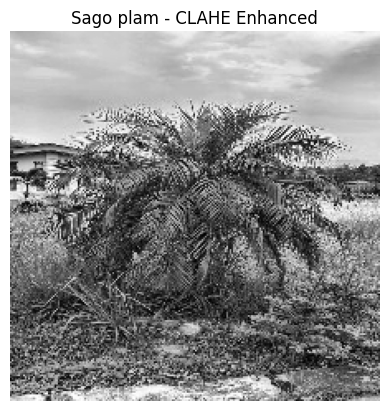

[plam lily] Applying CLAHE to 20 images.


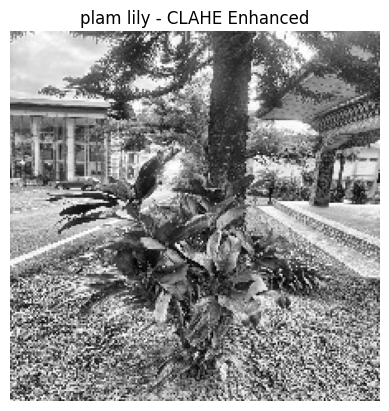

[Monoon longifolium] Applying CLAHE to 20 images.


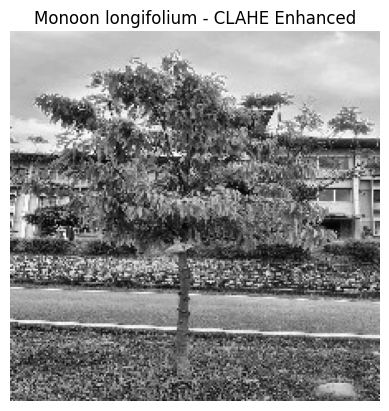

In [9]:
def apply_clahe_to_random_images(input_root, limit=20):
    """
    Applies CLAHE to 20 grayscale images per plant folder, excluding those
    already rotated or flipped. Enhanced images are saved with '_clahe' suffix.
    """
    plant_folders = os.listdir(input_root)

    for plant_name in plant_folders:
        plant_path = os.path.join(input_root, plant_name)

        if not os.path.isdir(plant_path):
            continue

        # Filter only original grayscale images, skipping augmented ones
        image_files = [
            f for f in os.listdir(plant_path)
            if f.endswith(('.png', '.jpg', '.jpeg'))
            and '_rotated' not in f
            and '_flipped' not in f
            and '_clahe' not in f
        ]

        # Select up to '20' images randomly
        selected_images = random.sample(image_files, min(limit, len(image_files)))
        print(f"[{plant_name}] Applying CLAHE to {len(selected_images)} images.")

        for idx, image_name in enumerate(selected_images):
            image_path = os.path.join(plant_path, image_name)

            # Load grayscale image
            image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

            # Apply CLAHE
            clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
            enhanced_image = clahe.apply(image)

            # Save with '_clahe' suffix
            name, ext = os.path.splitext(image_name)
            output_path = os.path.join(plant_path, f"{name}_clahe{ext}")
            cv2.imwrite(output_path, enhanced_image)

            # Shows one sample per plant
            if idx == 0:
                plt.imshow(enhanced_image, cmap='gray')
                plt.title(f"{plant_name} - CLAHE Enhanced")
                plt.axis('off')
                plt.show()

# Path to grayscale images
grayscale_folder = "/content/drive/MyDrive/Processed_plants"

# Applys CLAHE
apply_clahe_to_random_images(grayscale_folder, limit=20)


## Random Brightness and Contrast shift
This function applies a random brightness and contrast shift to 20 grayscale images per plant category. The function randomly selects images and applies a shift in brightness and contrast using cv2.convertScaleAbs. The result is saved with a "_bright" suffix to distinguish it from the original image. This technique helps augment the dataset by adding variations in lighting conditions, which can improve model robustness in recognizing plant features. The first adjusted image from each plant category is displayed for visualization purposes.

Applying brightness/contrast to 20 images in Areca palm
  [Areca palm] photo_2025-05-07_11-38-16_bright.jpg saved (1 of 20)


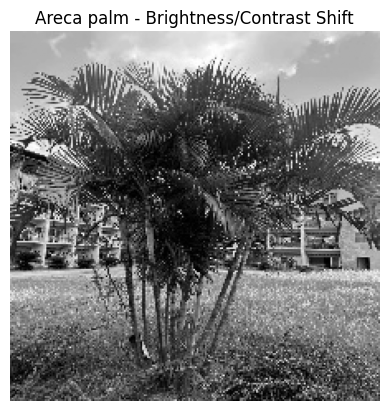

  [Areca palm] photo_2025-05-07_11-38-50_bright.jpg saved (2 of 20)
  [Areca palm] photo_2025-04-29_10-57-35_bright.jpg saved (3 of 20)
  [Areca palm] photo_2025-04-30_18-35-42_bright.jpg saved (4 of 20)
  [Areca palm] photo_2025-05-07_11-38-59_bright.jpg saved (5 of 20)
  [Areca palm] photo_2025-05-07_11-39-12_bright.jpg saved (6 of 20)
  [Areca palm] photo_2025-05-07_11-38-36_bright.jpg saved (7 of 20)
  [Areca palm] photo_2025-05-07_11-38-47_bright.jpg saved (8 of 20)
  [Areca palm] photo_2025-04-30_18-35-34 (2)_bright.jpg saved (9 of 20)
  [Areca palm] photo_2025-05-07_11-37-59_bright.jpg saved (10 of 20)
  [Areca palm] photo_2025-04-30_18-35-40_bright.jpg saved (11 of 20)
  [Areca palm] photo_2025-04-29_10-57-29_bright.jpg saved (12 of 20)
  [Areca palm] photo_2025-05-07_11-39-01_bright.jpg saved (13 of 20)
  [Areca palm] photo_2025-05-07_11-38-24_bright.jpg saved (14 of 20)
  [Areca palm] photo_2025-05-07_11-38-53_bright.jpg saved (15 of 20)
  [Areca palm] photo_2025-05-07_11-38-

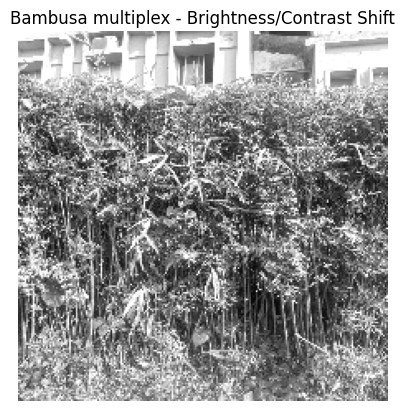

  [Bambusa multiplex] photo_2025-04-30_16-39-22_bright.jpg saved (2 of 20)
  [Bambusa multiplex] photo_2025-04-30_16-38-46_bright.jpg saved (3 of 20)
  [Bambusa multiplex] photo_2025-04-30_16-40-46_bright.jpg saved (4 of 20)
  [Bambusa multiplex] photo_2025-04-30_16-39-24_bright.jpg saved (5 of 20)
  [Bambusa multiplex] photo_2025-04-30_16-40-53_bright.jpg saved (6 of 20)
  [Bambusa multiplex] photo_2025-04-30_16-40-26_bright.jpg saved (7 of 20)
  [Bambusa multiplex] photo_2025-04-30_16-39-15_bright.jpg saved (8 of 20)
  [Bambusa multiplex] photo_2025-04-30_16-40-38_bright.jpg saved (9 of 20)
  [Bambusa multiplex] photo_2025-04-30_16-38-37_bright.jpg saved (10 of 20)
  [Bambusa multiplex] photo_2025-04-30_18-42-13_bright.jpg saved (11 of 20)
  [Bambusa multiplex] photo_2025-04-30_16-38-36_bright.jpg saved (12 of 20)
  [Bambusa multiplex] photo_2025-04-30_16-41-05_bright.jpg saved (13 of 20)
  [Bambusa multiplex] photo_2025-04-30_18-42-10_bright.jpg saved (14 of 20)
  [Bambusa multiplex

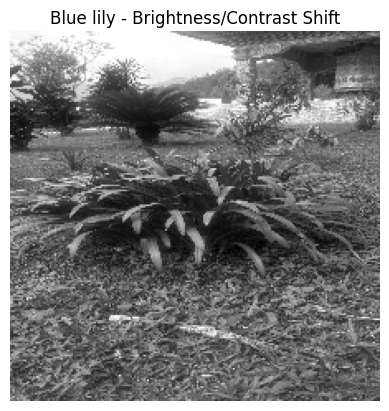

  [Blue lily] photo_2025-04-30_18-35-12_bright.jpg saved (2 of 20)
  [Blue lily] photo_2025-04-30_18-35-22_bright.jpg saved (3 of 20)
  [Blue lily] photo_2025-04-30_18-35-06_bright.jpg saved (4 of 20)
  [Blue lily] photo_2025-04-30_18-35-01_bright.jpg saved (5 of 20)
  [Blue lily] photo_2025-04-30_16-33-08_bright.jpg saved (6 of 20)
  [Blue lily] photo_2025-04-30_18-34-54_bright.jpg saved (7 of 20)
  [Blue lily] photo_2025-04-30_18-35-04_bright.jpg saved (8 of 20)
  [Blue lily] photo_2025-04-30_18-35-02_bright.jpg saved (9 of 20)
  [Blue lily] photo_2025-04-30_18-34-40_bright.jpg saved (10 of 20)
  [Blue lily] photo_2025-04-30_18-34-53_bright.jpg saved (11 of 20)
  [Blue lily] photo_2025-04-30_18-35-20_bright.jpg saved (12 of 20)
  [Blue lily] photo_2025-04-30_18-34-49_bright.jpg saved (13 of 20)
  [Blue lily] photo_2025-04-30_18-34-52_bright.jpg saved (14 of 20)
  [Blue lily] photo_2025-04-30_18-34-29_bright.jpg saved (15 of 20)
  [Blue lily] photo_2025-04-30_18-35-10_bright.jpg saved

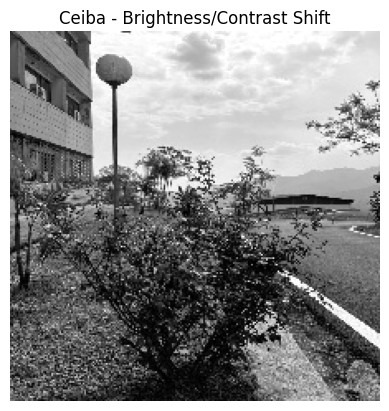

  [Ceiba] photo_2025-04-30_16-33-50_bright.jpg saved (2 of 20)
  [Ceiba] photo_2025-04-30_16-33-44_bright.jpg saved (3 of 20)
  [Ceiba] photo_2025-04-30_16-34-26_bright.jpg saved (4 of 20)
  [Ceiba] photo_2025-04-30_18-42-23_bright.jpg saved (5 of 20)
  [Ceiba] photo_2025-04-30_16-34-06_bright.jpg saved (6 of 20)
  [Ceiba] photo_2025-04-30_18-42-20 (2)_bright.jpg saved (7 of 20)
  [Ceiba] photo_2025-04-30_18-35-50_bright.jpg saved (8 of 20)
  [Ceiba] photo_2025-04-30_16-34-13_bright.jpg saved (9 of 20)
  [Ceiba] photo_2025-04-30_16-34-10_bright.jpg saved (10 of 20)
  [Ceiba] photo_2025-04-30_18-42-25 (2)_bright.jpg saved (11 of 20)
  [Ceiba] photo_2025-04-30_18-42-19_bright.jpg saved (12 of 20)
  [Ceiba] photo_2025-04-30_16-33-48_bright.jpg saved (13 of 20)
  [Ceiba] photo_2025-04-30_16-34-40_bright.jpg saved (14 of 20)
  [Ceiba] photo_2025-04-30_16-33-56_bright.jpg saved (15 of 20)
  [Ceiba] photo_2025-04-30_16-34-29_bright.jpg saved (16 of 20)
  [Ceiba] photo_2025-04-30_16-34-28_brig

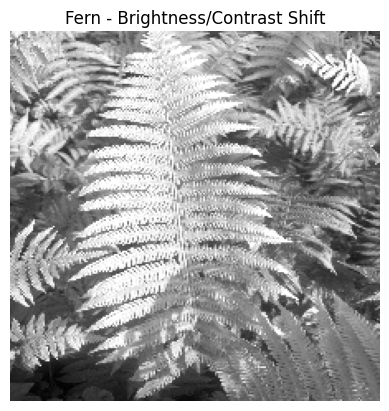

  [Fern] photo_2025-04-30_16-41-09_bright.jpg saved (2 of 20)
  [Fern] photo_2025-04-30_16-41-22_bright.jpg saved (3 of 20)
  [Fern] photo_2025-04-30_16-41-23_bright.jpg saved (4 of 20)
  [Fern] photo_2025-04-30_16-41-57_bright.jpg saved (5 of 20)
  [Fern] photo_2025-04-30_16-41-55_bright.jpg saved (6 of 20)
  [Fern] photo_2025-04-30_16-41-38_bright.jpg saved (7 of 20)
  [Fern] photo_2025-04-30_16-42-05_bright.jpg saved (8 of 20)
  [Fern] photo_2025-04-30_16-42-02_bright.jpg saved (9 of 20)
  [Fern] photo_2025-04-30_16-41-33_bright.jpg saved (10 of 20)
  [Fern] photo_2025-04-30_16-41-18_bright.jpg saved (11 of 20)
  [Fern] photo_2025-04-30_16-41-24_bright.jpg saved (12 of 20)
  [Fern] photo_2025-04-30_16-42-01_bright.jpg saved (13 of 20)
  [Fern] photo_2025-04-30_16-41-13_bright.jpg saved (14 of 20)
  [Fern] photo_2025-04-30_16-41-16_bright.jpg saved (15 of 20)
  [Fern] photo_2025-04-30_16-41-08_bright.jpg saved (16 of 20)
  [Fern] photo_2025-04-30_16-41-43_bright.jpg saved (17 of 20)


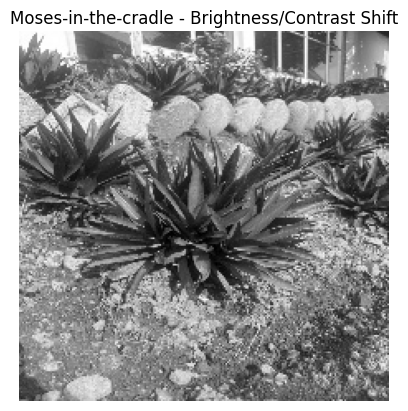

  [Moses-in-the-cradle] photo_2025-04-30_16-35-27_bright.jpg saved (2 of 20)
  [Moses-in-the-cradle] photo_2025-04-30_16-36-43_bright.jpg saved (3 of 20)
  [Moses-in-the-cradle] photo_2025-04-30_16-37-49_bright.jpg saved (4 of 20)
  [Moses-in-the-cradle] photo_2025-04-30_16-37-40_bright.jpg saved (5 of 20)
  [Moses-in-the-cradle] photo_2025-04-30_16-38-04_bright.jpg saved (6 of 20)
  [Moses-in-the-cradle] photo_2025-04-30_16-37-12_bright.jpg saved (7 of 20)
  [Moses-in-the-cradle] photo_2025-04-30_16-37-45_bright.jpg saved (8 of 20)
  [Moses-in-the-cradle] photo_2025-04-30_16-38-09_bright.jpg saved (9 of 20)
  [Moses-in-the-cradle] photo_2025-04-30_16-37-32_bright.jpg saved (10 of 20)
  [Moses-in-the-cradle] photo_2025-04-30_16-37-53_bright.jpg saved (11 of 20)
  [Moses-in-the-cradle] photo_2025-04-30_16-35-13_bright.jpg saved (12 of 20)
  [Moses-in-the-cradle] photo_2025-04-30_16-35-16_bright.jpg saved (13 of 20)
  [Moses-in-the-cradle] photo_2025-04-30_16-37-51_bright.jpg saved (14 o

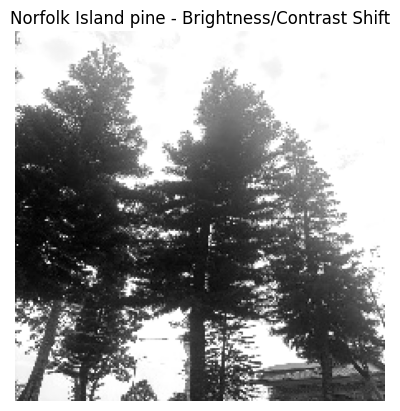

  [Norfolk Island pine] photo_2025-04-30_16-31-34_bright.jpg saved (2 of 20)
  [Norfolk Island pine] photo_2025-04-30_18-34-04_bright.jpg saved (3 of 20)
  [Norfolk Island pine] photo_2025-04-30_16-31-44_bright.jpg saved (4 of 20)
  [Norfolk Island pine] photo_2025-04-30_18-33-57_bright.jpg saved (5 of 20)
  [Norfolk Island pine] photo_2025-04-30_18-33-52_bright.jpg saved (6 of 20)
  [Norfolk Island pine] photo_2025-04-30_18-34-17_bright.jpg saved (7 of 20)
  [Norfolk Island pine] photo_2025-04-30_18-34-03_bright.jpg saved (8 of 20)
  [Norfolk Island pine] photo_2025-04-30_18-33-49_bright.jpg saved (9 of 20)
  [Norfolk Island pine] photo_2025-04-30_16-31-20_bright.jpg saved (10 of 20)
  [Norfolk Island pine] photo_2025-04-30_16-31-38_bright.jpg saved (11 of 20)
  [Norfolk Island pine] photo_2025-04-30_16-31-24_bright.jpg saved (12 of 20)
  [Norfolk Island pine] photo_2025-04-30_18-34-14_bright.jpg saved (13 of 20)
  [Norfolk Island pine] photo_2025-04-30_18-33-56_bright.jpg saved (14 o

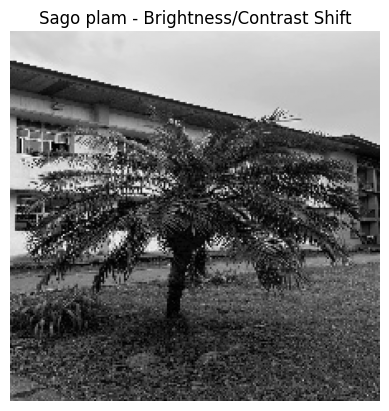

  [Sago plam] photo_2025-04-29_10-57-28_bright.jpg saved (2 of 20)
  [Sago plam] photo_2025-05-07_11-40-12_bright.jpg saved (3 of 20)
  [Sago plam] photo_2025-04-30_18-35-46_bright.jpg saved (4 of 20)
  [Sago plam] photo_2025-05-07_11-42-21_bright.jpg saved (5 of 20)
  [Sago plam] photo_2025-04-29_10-57-01_bright.jpg saved (6 of 20)
  [Sago plam] photo_2025-04-29_10-57-18_bright.jpg saved (7 of 20)
  [Sago plam] photo_2025-04-29_10-57-15_bright.jpg saved (8 of 20)
  [Sago plam] photo_2025-05-07_11-40-20_bright.jpg saved (9 of 20)
  [Sago plam] photo_2025-05-07_11-42-24_bright.jpg saved (10 of 20)
  [Sago plam] photo_2025-04-30_18-34-20_bright.jpg saved (11 of 20)
  [Sago plam] photo_2025-04-30_18-34-27_bright.jpg saved (12 of 20)
  [Sago plam] photo_2025-05-07_11-42-12_bright.jpg saved (13 of 20)
  [Sago plam] photo_2025-04-30_18-34-25_bright.jpg saved (14 of 20)
  [Sago plam] photo_2025-04-29_10-57-21_bright.jpg saved (15 of 20)
  [Sago plam] photo_2025-04-30_18-35-44_bright.jpg saved

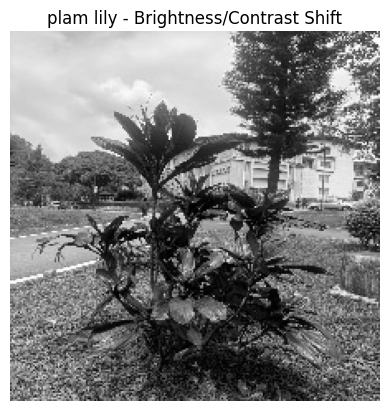

  [plam lily] photo_2025-04-30_16-32-35_bright.jpg saved (2 of 20)
  [plam lily] photo_2025-04-30_16-32-44_bright.jpg saved (3 of 20)
  [plam lily] photo_2025-04-30_16-32-18_bright.jpg saved (4 of 20)
  [plam lily] photo_2025-04-30_16-32-12_bright.jpg saved (5 of 20)
  [plam lily] photo_2025-04-30_16-32-01_bright.jpg saved (6 of 20)
  [plam lily] photo_2025-04-30_16-32-10_bright.jpg saved (7 of 20)
  [plam lily] photo_2025-04-30_16-32-14_bright.jpg saved (8 of 20)
  [plam lily] photo_2025-04-30_16-32-54_bright.jpg saved (9 of 20)
  [plam lily] photo_2025-04-30_16-32-27_bright.jpg saved (10 of 20)
  [plam lily] photo_2025-04-30_16-32-45_bright.jpg saved (11 of 20)
  [plam lily] photo_2025-04-30_16-32-07_bright.jpg saved (12 of 20)
  [plam lily] photo_2025-04-30_16-32-33_bright.jpg saved (13 of 20)
  [plam lily] photo_2025-04-30_16-32-25_bright.jpg saved (14 of 20)
  [plam lily] photo_2025-04-30_16-31-48_bright.jpg saved (15 of 20)
  [plam lily] photo_2025-04-30_16-32-06_bright.jpg saved

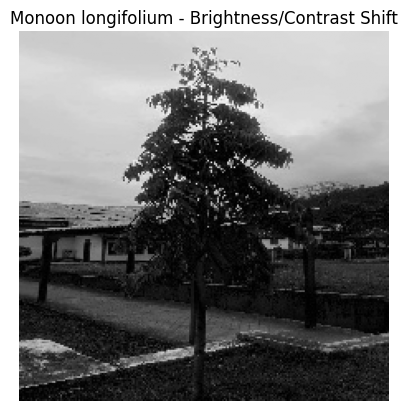

  [Monoon longifolium] photo_2025-04-30_18-33-23_bright.jpg saved (2 of 20)
  [Monoon longifolium] photo_2025-04-30_16-31-16_bright.jpg saved (3 of 20)
  [Monoon longifolium] photo_2025-04-30_18-35-49_bright.jpg saved (4 of 20)
  [Monoon longifolium] photo_2025-04-30_18-33-09_bright.jpg saved (5 of 20)
  [Monoon longifolium] photo_2025-04-30_16-31-15_bright.jpg saved (6 of 20)
  [Monoon longifolium] photo_2025-04-30_18-33-30_bright.jpg saved (7 of 20)
  [Monoon longifolium] photo_2025-04-30_18-33-17 (2)_bright.jpg saved (8 of 20)
  [Monoon longifolium] photo_2025-04-30_18-33-22_bright.jpg saved (9 of 20)
  [Monoon longifolium] photo_2025-04-30_18-33-06_bright.jpg saved (10 of 20)
  [Monoon longifolium] photo_2025-04-30_18-33-19_bright.jpg saved (11 of 20)
  [Monoon longifolium] photo_2025-04-30_18-35-48_bright.jpg saved (12 of 20)
  [Monoon longifolium] photo_2025-04-30_18-33-37_bright.jpg saved (13 of 20)
  [Monoon longifolium] photo_2025-04-30_18-32-57_bright.jpg saved (14 of 20)
  [

In [10]:
# Function to apply brightness and contrast shift to 20 grayscale images
def apply_brightness_contrast_shift(input_root, limit=20):
    # Get all plant categories
    plant_folders = os.listdir(input_root)

    for plant_name in plant_folders:
        input_folder = os.path.join(input_root, plant_name)

        if not os.path.isdir(input_folder):
            continue

        # List of only original grayscale images (skip rotated, flipped, CLAHE, and brightened)
        original_images = [f for f in os.listdir(input_folder)
                           if f.lower().endswith(('.png', '.jpg', '.jpeg')) and
                           '_rotated' not in f and '_flipped' not in f and
                           '_clahe' not in f and '_bright' not in f]

        # Randomly select 20 images (or fewer if not enough)
        selected_images = random.sample(original_images, min(limit, len(original_images)))
        print(f"Applying brightness/contrast to {len(selected_images)} images in {plant_name}")

        for i, image_name in enumerate(selected_images, 1):
            image_path = os.path.join(input_folder, image_name)

            # Read image in grayscale
            image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

            # Apply random brightness and contrast shift
            brightness_shift = random.randint(-40, 40)
            contrast_shift = random.randint(-30, 30)

            adjusted = cv2.convertScaleAbs(image, alpha=1 + contrast_shift / 100.0, beta=brightness_shift)

            # Save the result with "_bright" suffix
            name, ext = os.path.splitext(image_name)
            output_name = f"{name}_bright{ext}"
            output_path = os.path.join(input_folder, output_name)
            cv2.imwrite(output_path, adjusted)

            print(f"  [{plant_name}] {output_name} saved ({i} of {len(selected_images)})")

            # Show the first one for visualization
            if i == 1:
                plt.imshow(adjusted, cmap='gray')
                plt.title(f"{plant_name} - Brightness/Contrast Shift")
                plt.axis('off')
                plt.show()

# Set the path to your grayscale + augmented image folders
input_root = '/content/drive/MyDrive/Processed_plants'

# Run the function
apply_brightness_contrast_shift(input_root, limit=20)
